In [1]:
%load_ext autoreload
%autoreload 2
import infercnvpy as cnv
import scanpy as sc
from scanpy_helpers.annotation import AnnotationHelper
import scanpy_helpers.de as de
import numpy as np
import scvi
import pandas as pd

INFO:numexpr.utils:Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:get_version:dirname: Trying to get version of get_version from dirname /data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages
INFO:get_version:dirname: Failed; Does not match re.compile('get[_-]version-([\\d.]+?)(?:\\.dev(\\d+))?(?:[_+-]([0-9a-zA-Z.]+))?$')
INFO:get_version:git: Trying to get version from git in directory /data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages
INFO:get_version:git: Failed; directory is not managed by git
INFO:get_version:metadata: Trying to get version for get_version in dir /data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages
INFO:get_version:metadata: Succeeded
INFO:get_version:dirname: Trying to get version of legacy_api_wrap from dirname /data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-pack

In [2]:
deploy_dir = "../../deploy/Ab1MxvlS9c56BaA0Z94J/figures/"
output_dir = "../../data/20_annotate_all_cells/"

In [3]:
ah = AnnotationHelper()

In [4]:
sc.set_figure_params(figsize=(5, 5))

In [5]:
adata = sc.read_h5ad(
    "../../data/10_processed/sc_rna_seq/integrated_merged_nsclc_heterogeneity.h5ad"
)

In [6]:
adata_raw_counts = sc.read_h5ad(
    "../../data/10_processed/sc_rna_seq/merged_nsclc_heterogeneity.h5ad"
)

## run inferCNV

In [7]:
adata.raw.shape

(86061, 17567)

In [8]:
adata_infercnv = sc.AnnData(
    X=adata.raw.X,
    var=adata.raw.var,
    obs=adata.obs,
    obsm=adata.obsm,
    uns=adata.uns,
    obsp=adata.obsp,
).copy()
adata_infercnv.layers["raw_counts"] = adata_raw_counts[
    adata_infercnv.obs_names, adata_infercnv.var_names
].X.astype(int)

/data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [9]:
cnv.io.genomic_position_from_gtf(
    "/data/genomes/hg38/annotation/gencode/gencode.v33.primary_assembly.annotation.gtf",
    adata_infercnv,
)

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_name']


In [10]:
%%time
cnv.tl.infercnv(
    adata_infercnv,
    reference_key="cell_type_predicted",
    reference_cat=[
        "T cell CD4",
        "T cell CD8",
        "Monocyte conventional",
        "Monocyte non-conventional",
        "Macrophage",
        "Plasma cell",
        "B cell",
        "NK cell",
        "pDC",
    ],
    window_size=250,
)

  0%|          | 0/18 [00:00<?, ?it/s]

CPU times: user 16.2 s, sys: 12.8 s, total: 29.1 s
Wall time: 46.3 s


In [11]:
adata = adata_infercnv

In [12]:
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)
cnv.tl.umap(adata)

In [13]:
cnv.tl.leiden(adata, resolution=1.5)

In [14]:
cnv.tl.cnv_score(adata)

... storing 'chromosome' as categorical
... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


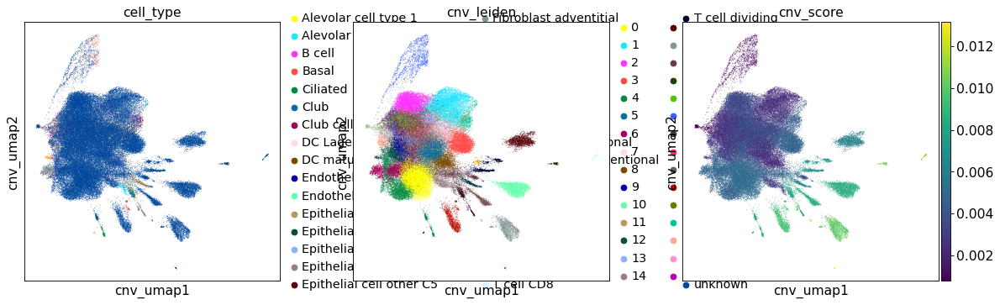

In [15]:
cnv.pl.umap(adata, color=["cell_type", "cnv_leiden", "cnv_score"])

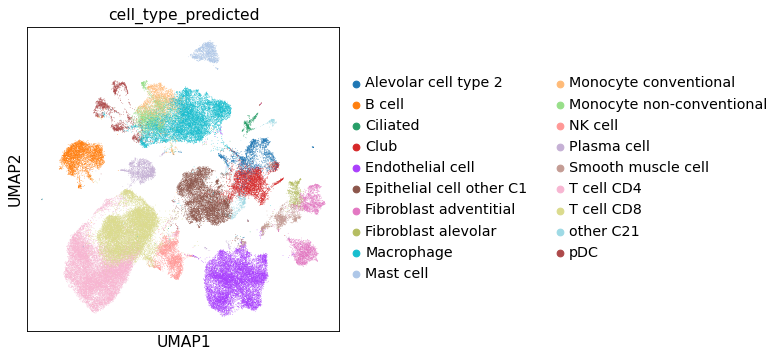

In [16]:
sc.pl.umap(adata, color="cell_type_predicted")

## annotate cell-types

In [17]:
sc.tl.leiden(adata)

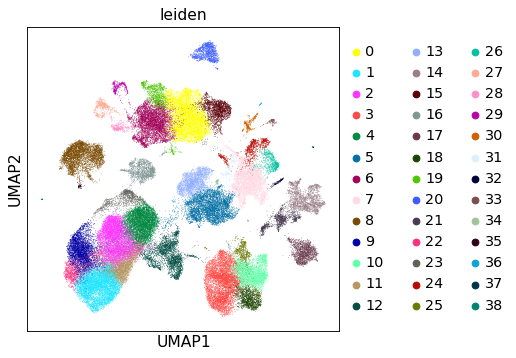

In [18]:
sc.pl.umap(adata, color="leiden")

Alevolar cell type 1


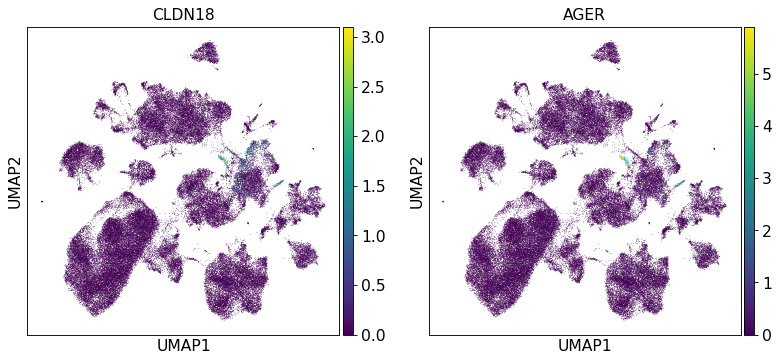

Alevolar cell type 2


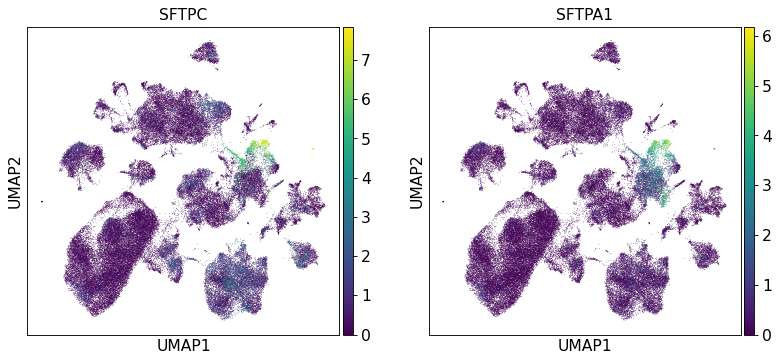

Alevolar cells (type 1 and 2)


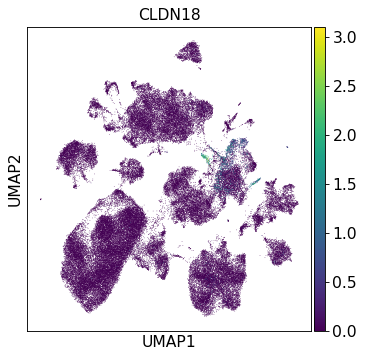

B cell


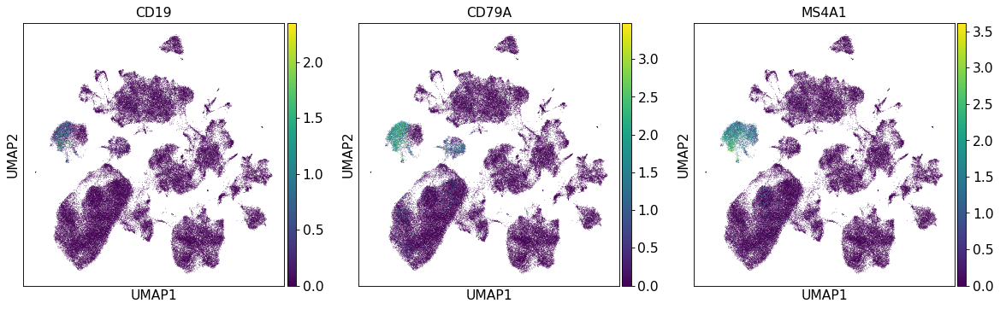

Basal


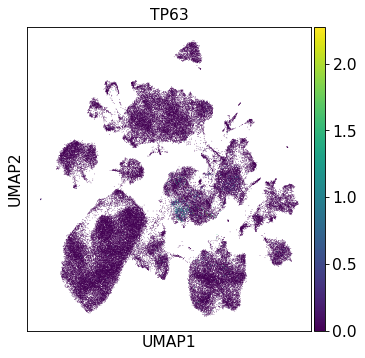

Ciliated


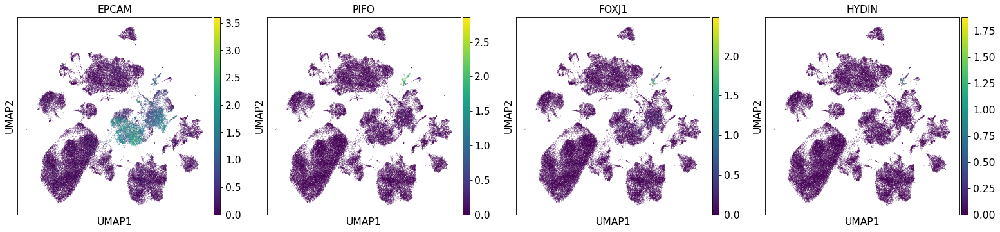

Club


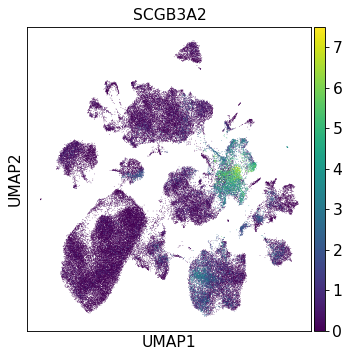

DC Lagerhans


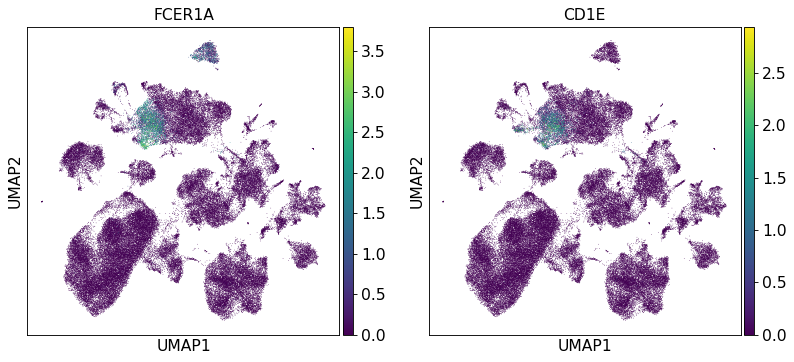

DC mature


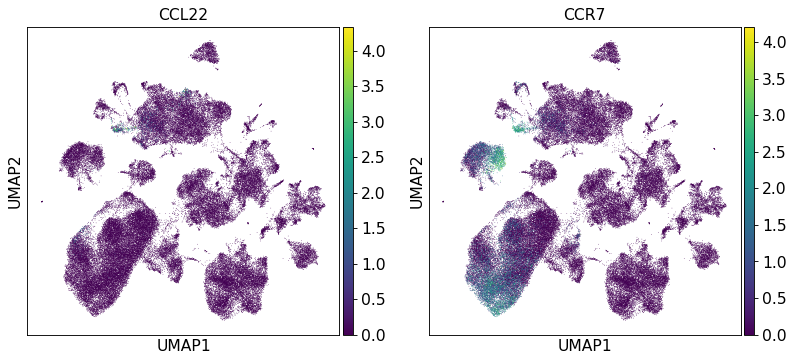

Dividing


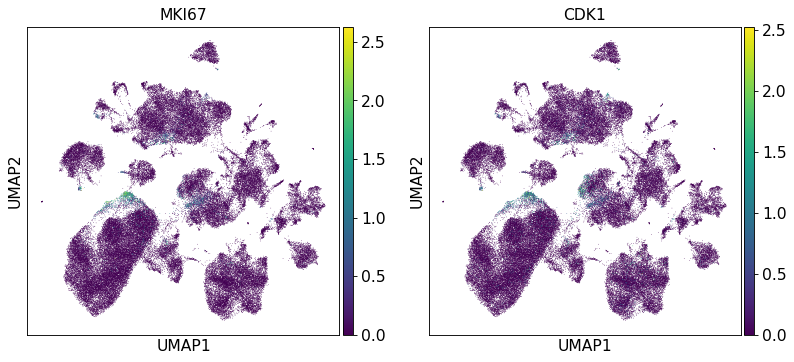

Endothelial cell


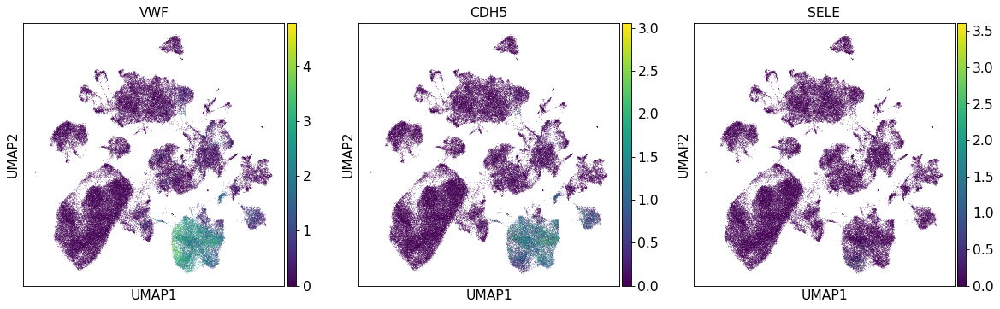

Endothelial cell lymphatic


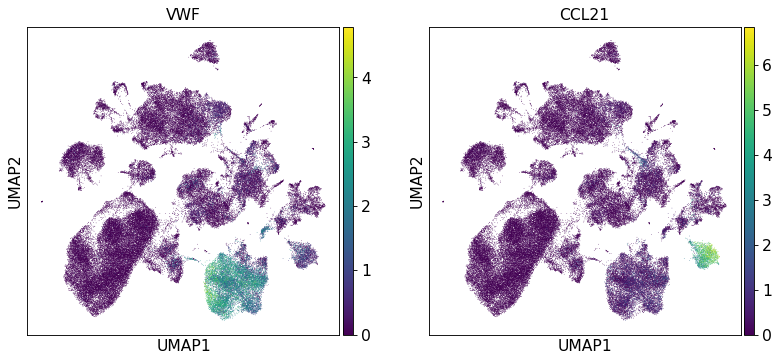

Epithelial


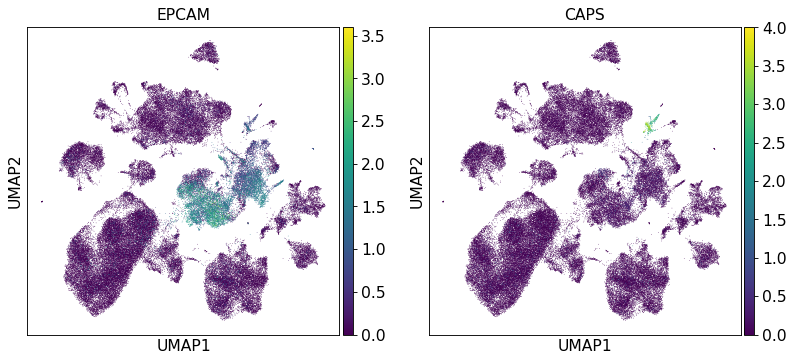

Fibroblast


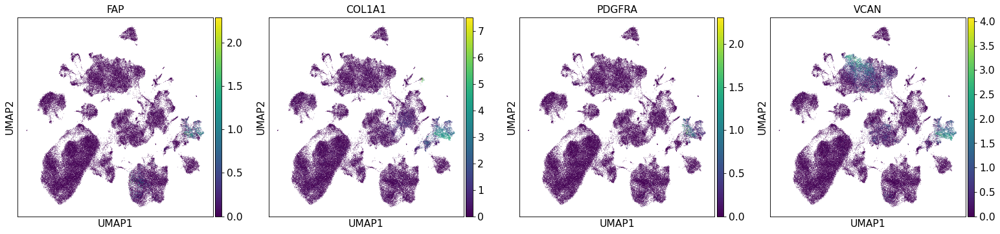

Fibroblast adventitial


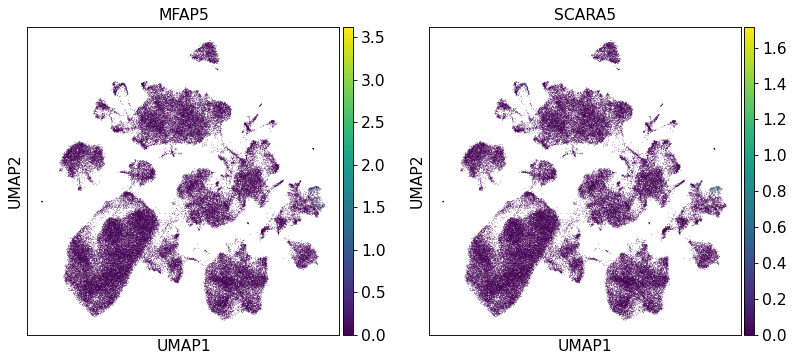

Fibroblast alveolar


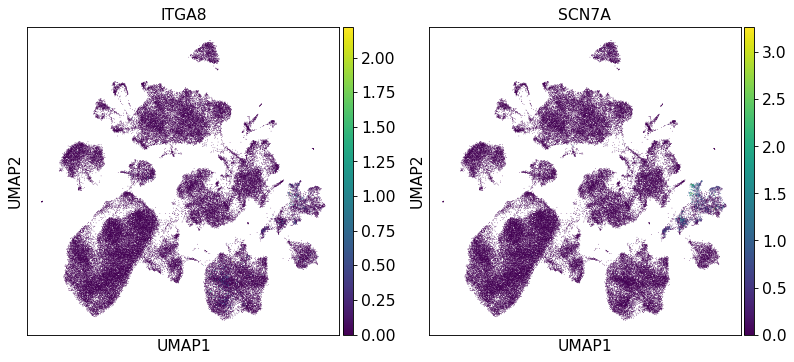

Goblet


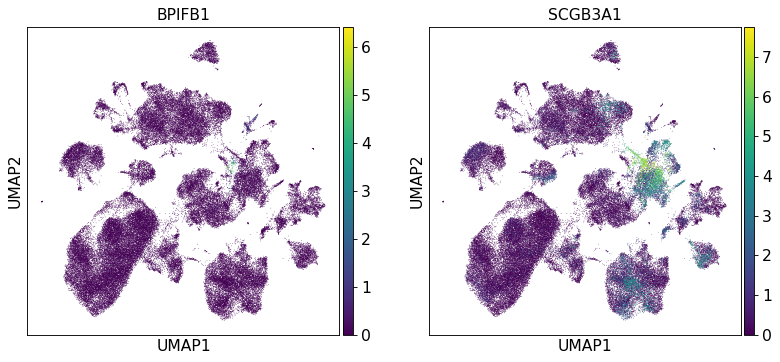

Ionocyte


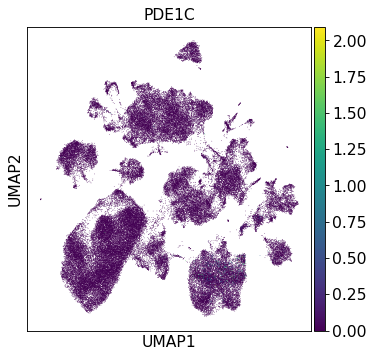

MDSC


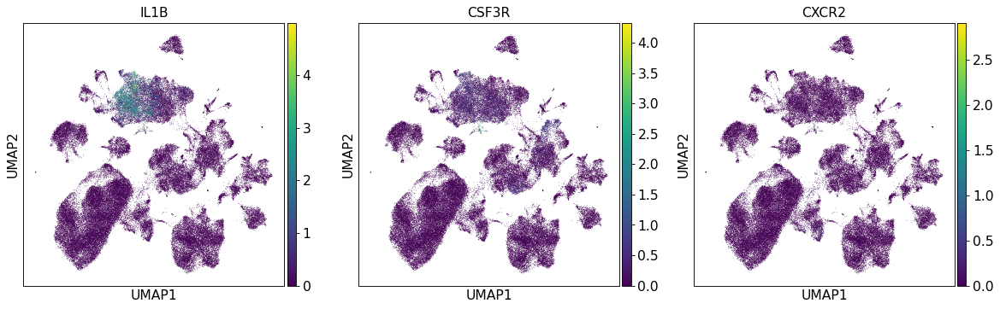

Macrophage


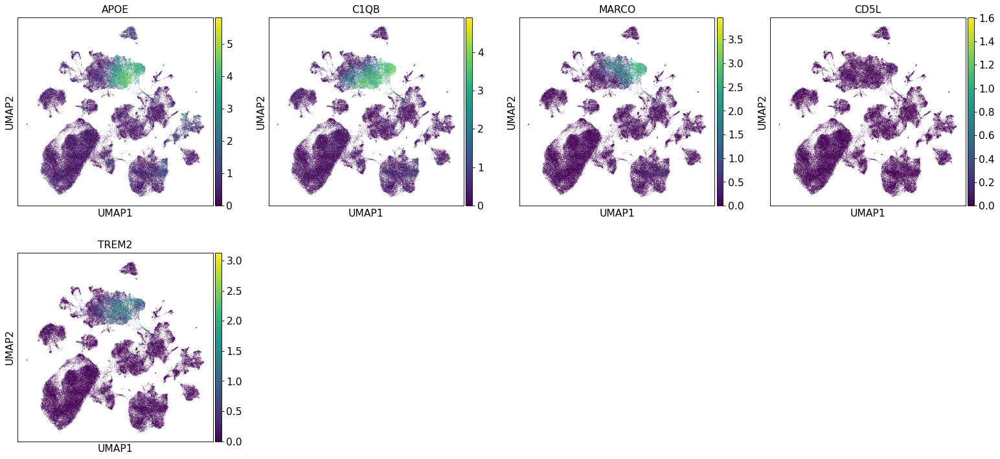

Macrophage alveolar


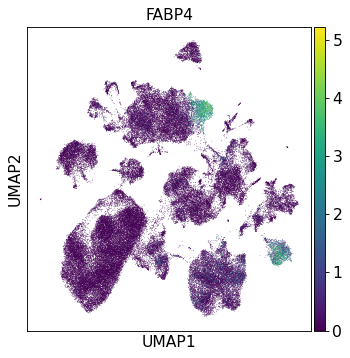

Mast cells


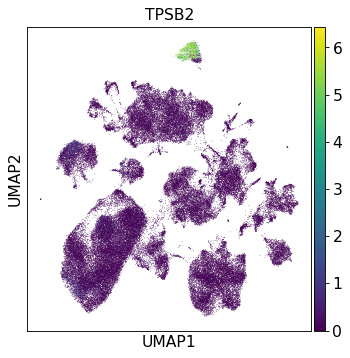

Mesothelial


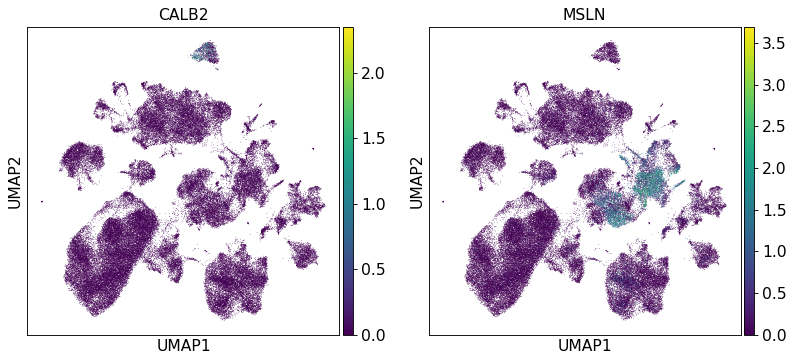

Monocyte


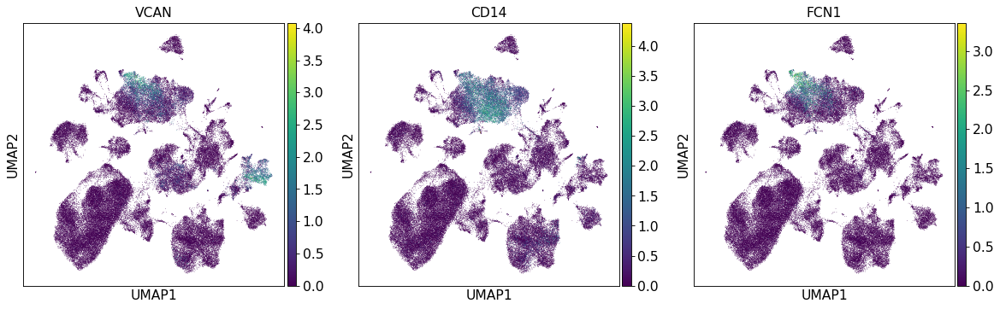

Monocyte conventional


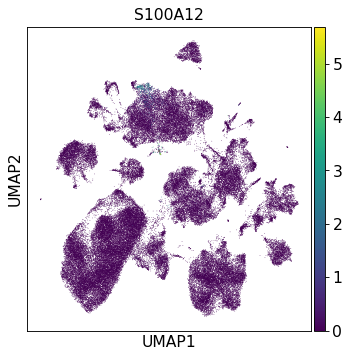

Monocyte non-coventional


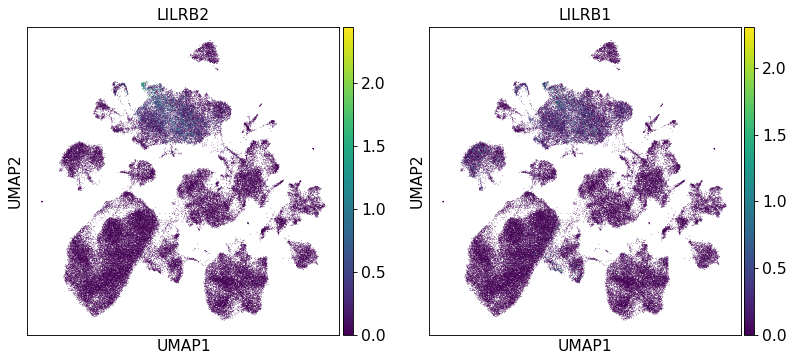

NK cell


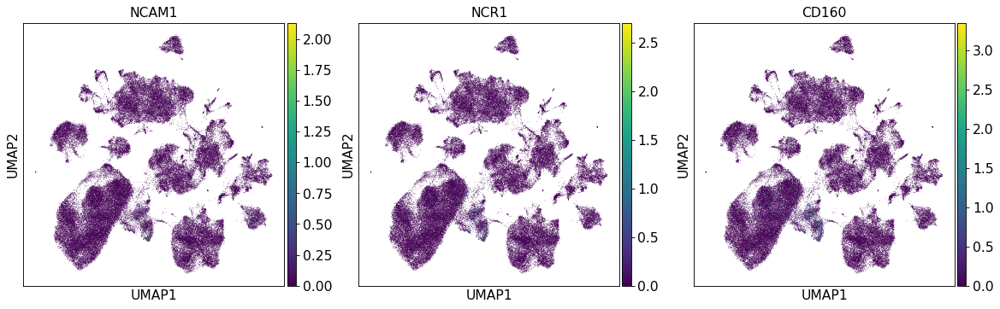

Pericyte


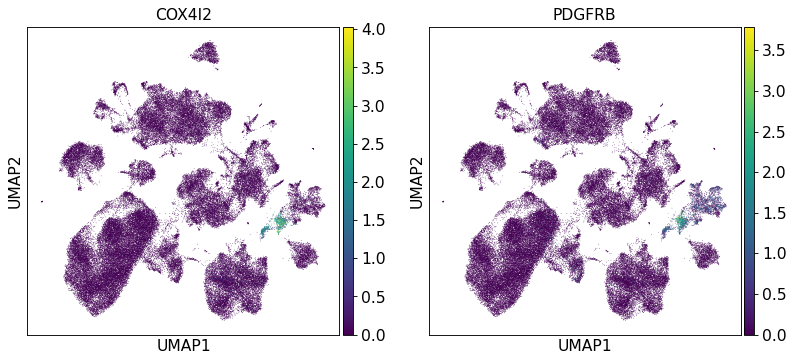

Plasma cell


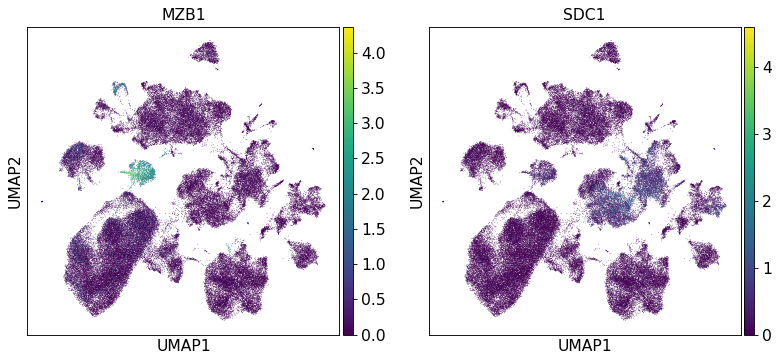

Pulmonary neuroendocrine cell


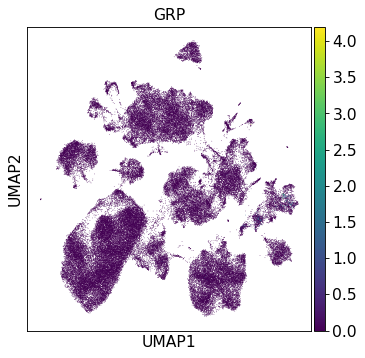

Smooth muscle cell


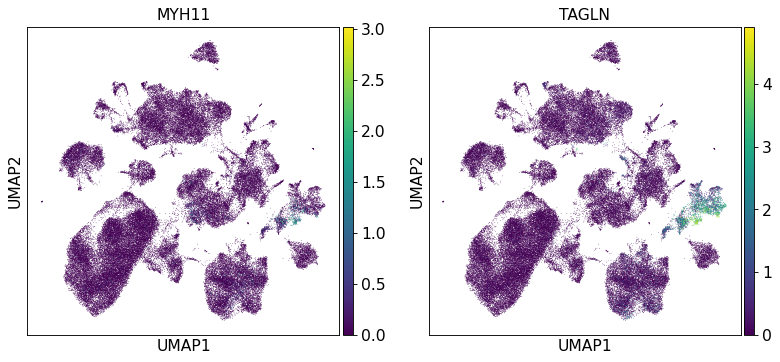

Suprabasal


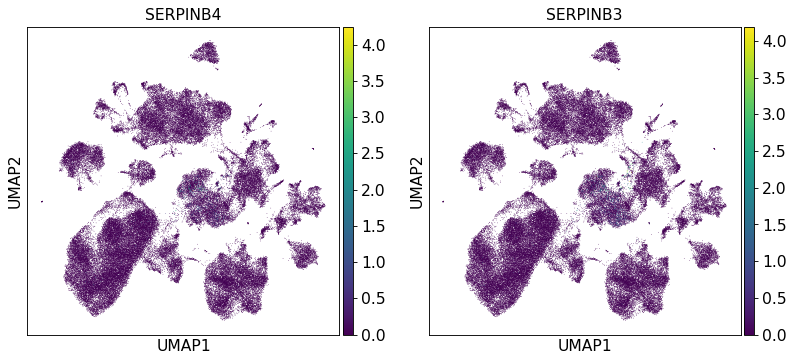

T cell


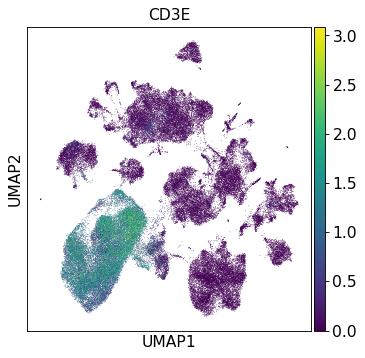

T cell CD4


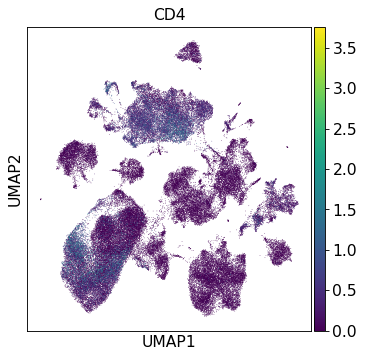

T cell CD8


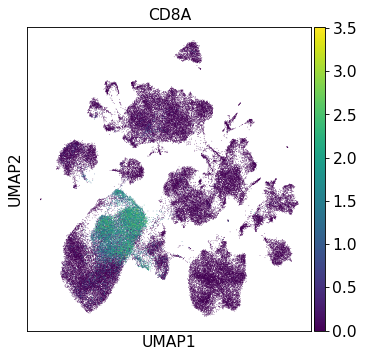

T cell cytotoxic


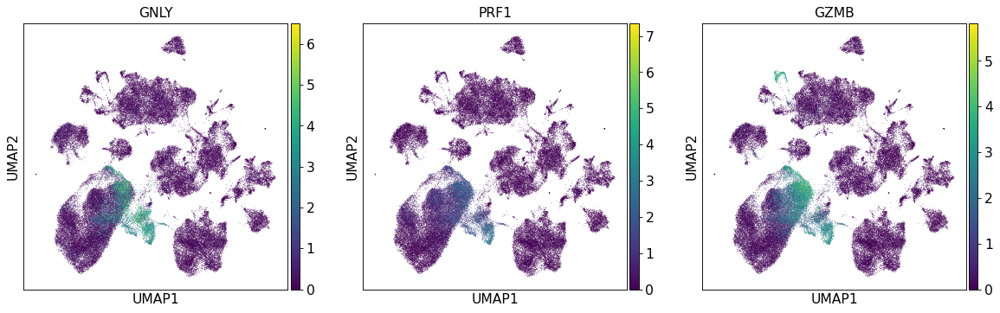

T cell regulatory


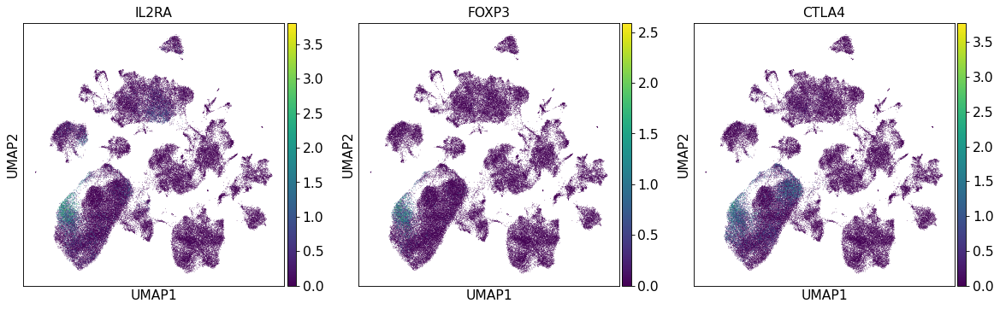

Vessel


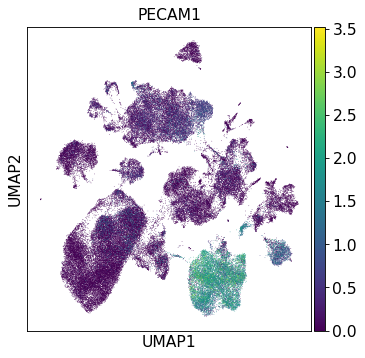

cDC1


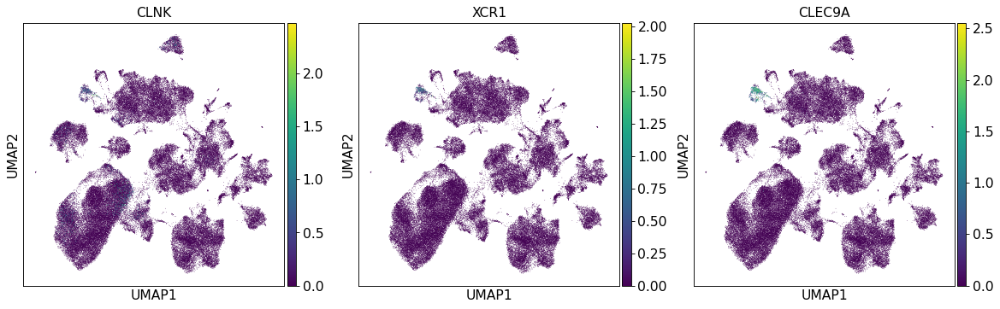

cDC2


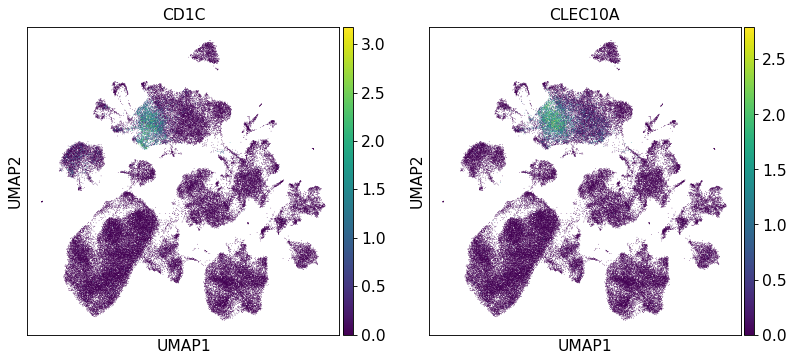

pDC


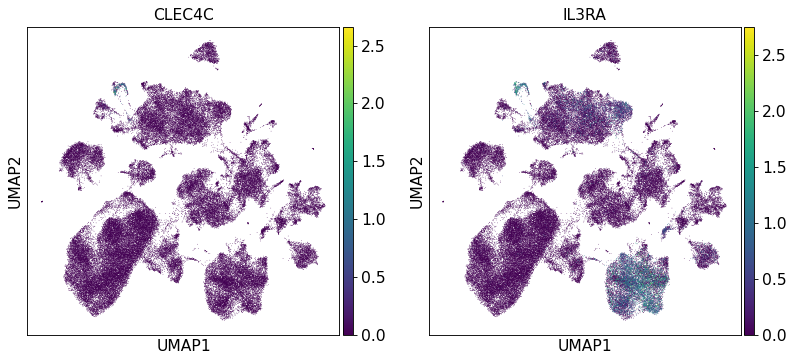

In [19]:
ah.plot_umap(adata)

Marker MIR205HG for Basal not in adata.var
Marker CFAP299 for Ciliated not in adata.var
Marker FOXI1 for Ionocyte not in adata.var
Marker CHGA for Pulmonary neuroendocrine cell not in adata.var


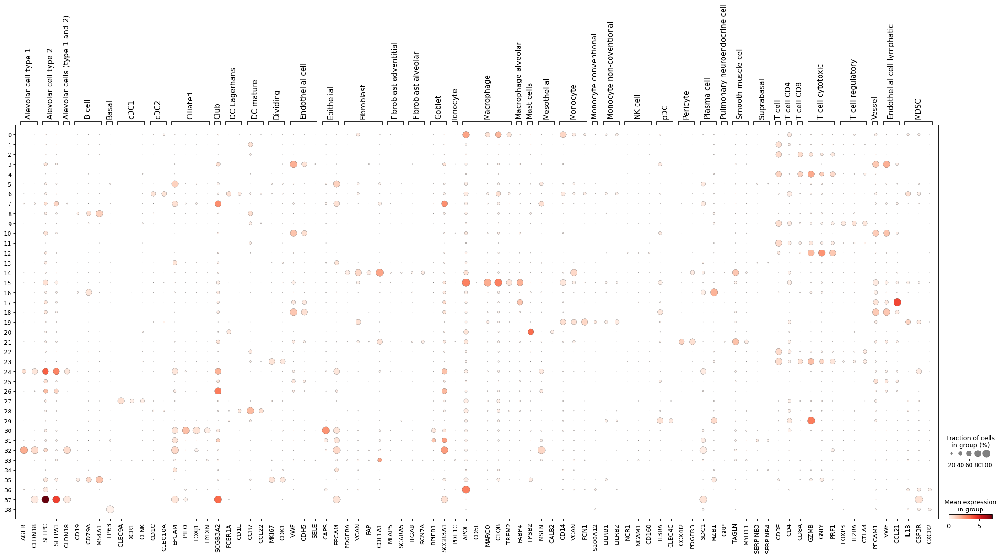

In [20]:
ah.plot_dotplot(adata)

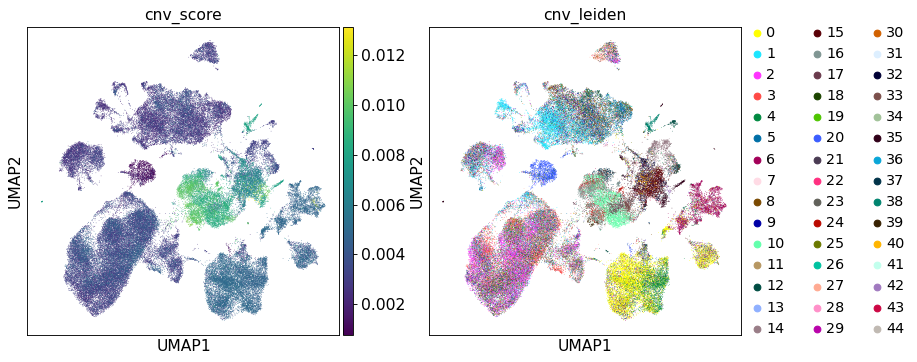

In [21]:
sc.pl.umap(adata, color=["cnv_score", "cnv_leiden"])

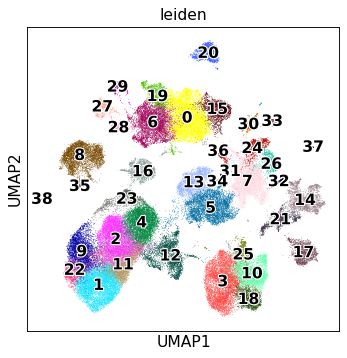

In [22]:
sc.pl.umap(adata, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [23]:
ct_map = {
    "B cell": [8, 35],
    "Ciliated": [30],
    "Endothelial cell": [3, 25, 10, 18],
    "Endothelial cell lymphatic": [17],
    "Epithelial cell": [5, 13, 34, 31, 7, 36, 32, 24, 26, 36, 37, 38, 33],
    "Mast cell": [20],
    "Myeloid": [15, 0, 19, 6, 27, 28],
    "NK cell": [12],
    "Stromal": [14, 21],
    "Plasma cell": [16],
    "T cell": [1, 22, 11, 9, 2, 4, 23],
    "pDC": [29],
}

... storing 'cell_type' as categorical


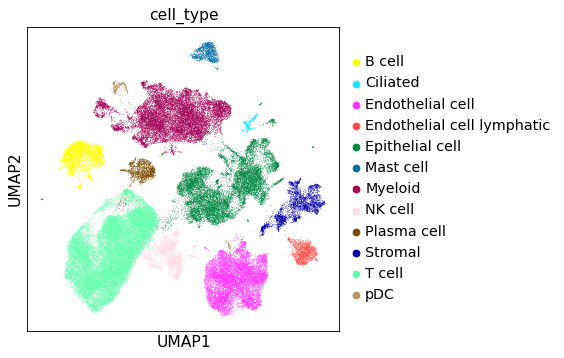

In [24]:
ah.annotate_cell_types(adata, ct_map)

In [ ]:
adata_t = adata[adata.obs["cell_type"].isin(("T cell", "NK cell")), :].copy()
ah.reprocess_adata_subset_scvi(adata_t, use_rep="X_scANVI", leiden_res=1.5)
ah.plot_umap(adata_t, filter_cell_type=["T cell", "Div", "NK"])

/data/scratch/sturm/conda/envs/2021-nsclc_heterogeneity-scanpy/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [ ]:
sc.pl.umap(adata_t, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [ ]:
sc.pl.umap(adata_t, color=["CD3G"])

In [ ]:
ct_mat = {
    "T cell dividing": [16],
    "T cell CD8": [12, 1, 22, 11, 6, 15, 3, 8],
    "T reg": [2, 14, 18],
    "T cell CD4": [5, 0, 7, 4, 24, 17, 9, 19, 21, 23],
    "NKT cell": [20],
    "NK cell": [10 ,13, 26, 25],
}

In [ ]:
ah.annotate_cell_types(adata_t, ct_mat)

In [ ]:
ah.integrate_back(adata, adata_t)

In [ ]:
adata_m = adata[adata.obs["cell_type"] == "Myeloid", :].copy()
ah.reprocess_adata_subset_scvi(adata_m, use_rep="X_scANVI", n_neighbors=15)
ah.plot_umap(adata_m, filter_cell_type=["Macro", "Mono", "DC"])

In [ ]:
sc.pl.umap(adata_m, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [ ]:
ct_map = {
    "DC mature": [14],
    "Macrophage": [1, 4, 10, 9, 12],
    "Monocyte conventional": [8, 17],
    "Monocyte non-conventional": [2, 6, 15, 16],
    "Macrophage alevolar": [0, 18],
    "cDC1": [13],
    "cDC2": [7, 5, 3, 11],
}

In [ ]:
ah.annotate_cell_types(adata_m, ct_map)

In [ ]:
ah.integrate_back(adata, adata_m)

In [ ]:
adata_s = adata[adata.obs["cell_type"] == "Stromal", :].copy()
ah.reprocess_adata_subset_scvi(
    adata_s, leiden_res=1, use_rep="X_scANVI", n_neighbors=15
)

In [ ]:
ah.plot_umap(adata_s, filter_cell_type=["Fibro", "muscle", "Peri", "Meso", "Endo"])

In [ ]:
sc.pl.umap(adata_s, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [ ]:
ct_map = {
    "Fibroblast": [4, 8, 10, 3, 9, 15, 13, 14],
    "Fibroblast adventitial": [7],
    "Fibroblast alevolar": [1, 5],
    "Smooth muscle cell": [6],
    "Pericyte": [0, 11, 12, 2],
}

In [ ]:
ah.annotate_cell_types(adata_s, ct_map)

In [ ]:
ah.integrate_back(adata, adata_s)

In [ ]:
adata_epi = adata[adata.obs["cell_type"] == "Epithelial cell", :].copy()

In [ ]:
ah.reprocess_adata_subset_scvi(adata_epi, use_rep="X_scANVI")

In [ ]:
ah.reprocess_adata_subset_cnv(adata_epi)

In [ ]:
cnv.pl.umap(
    adata_epi,
    color=["cnv_leiden", "cnv_score", "EPCAM"],
    legend_loc="on data",
    legend_fontoutline=2,
)

In [ ]:
cnv.tl.infercnv(adata_epi, reference_key="cnv_leiden", reference_cat=["4", "2", "10"])

In [ ]:
cnv.pl.chromosome_heatmap(adata_epi)

In [ ]:
sc.pl.umap(adata_epi, color=["cnv_leiden", "cnv_score", "EPCAM"])

In [ ]:
sc.pl.umap(adata_epi, color=["cnv_leiden"], groups="10")

In [ ]:
ah.plot_umap(
    adata_epi,
    filter_cell_type=[
        "Alevolar",
        "Basal",
        "Club",
        "Dividing",
        "Goblet",
        "Ionocyte",
        "Mesothelial",
        "Suprabasal",
        "Epi",
    ],
)

In [ ]:
sc.pl.umap(adata_epi, color="leiden", legend_loc="on data", legend_fontoutline=2)

In [52]:
benign_clusters = ["4", "10", "2"]

In [53]:
adata_epi.obs["cell_type"] = "Epithelial cell (malignant)"
adata_epi.obs.loc[
    (adata_epi.obs["leiden"] == "21")
    & adata_epi.obs["cnv_leiden"].isin(benign_clusters),
    "cell_type",
] = "Alevolar cell type 1"
adata_epi.obs.loc[
    adata_epi.obs["leiden"].isin(["19", "10"])
    & adata_epi.obs["cnv_leiden"].isin(benign_clusters),
    "cell_type",
] = "Alevolar cell type 2"
adata_epi.obs.loc[
    adata_epi.obs["leiden"].isin(["7"])
    & adata_epi.obs["cnv_leiden"].isin(benign_clusters),
    "cell_type",
] = "Club cell"

... storing 'cell_type' as categorical


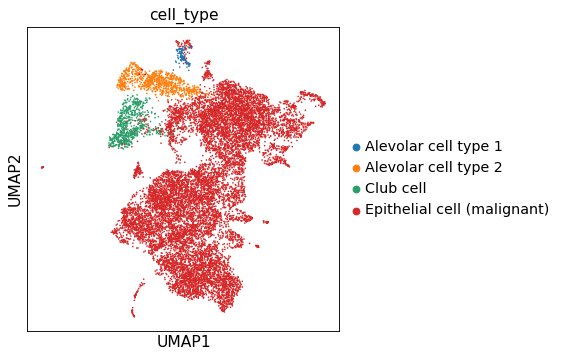

In [54]:
sc.pl.umap(adata_epi, color="cell_type")

... storing 'cell_type' as categorical


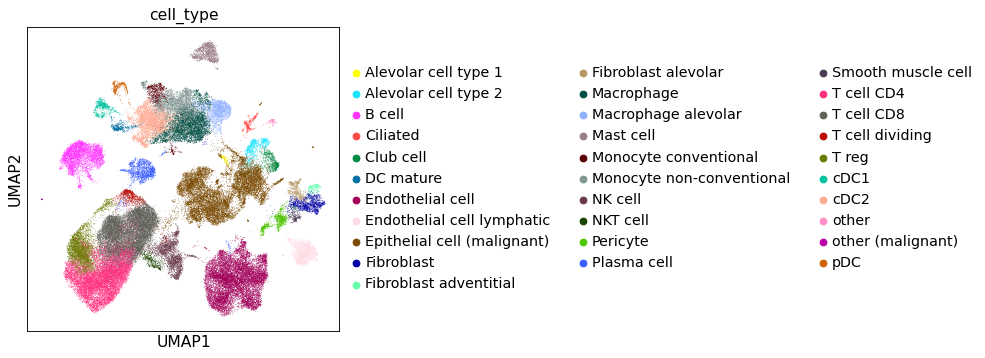

In [55]:
ah.integrate_back(adata, adata_epi)

In [56]:
adata.obs["is_malignant"] = [
    "malignant" if x else "non-malignant"
    for x in adata.obs["cell_type"].str.contains("mali")
]

... storing 'is_malignant' as categorical


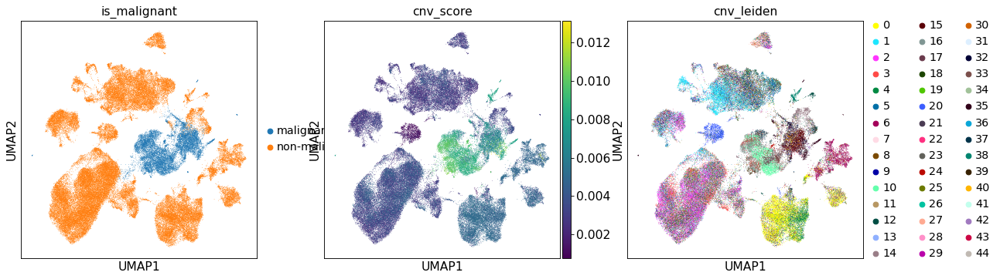

In [57]:
sc.pl.umap(adata, color=["is_malignant", "cnv_score", "cnv_leiden"])

In [58]:
# Cell-types of interest
cell_types_coarse = {
    "Tumor cell": ["Epithelial cell (malignant)", "other (malignant)"],
    "Epithelial cell (benign)": [
        "Alevolar cell type 1",
        "Alevolar cell type 2",
        "Club cell",
    ],
    "B cell": True,
    "Ciliated": True,
    "pDC": True,
    "Myeloid cell": [
        "DC mature",
        "cDC1",
        "cDC2",
        "Macrophage",
        "Monocyte conventional",
        "Monocyte non-conventional",
        "Macrophage alevolar",
    ],
    "T cell CD4": True,
    "T cell CD8": True,
    "T reg": True,
    "T cell dividing": True,
    "NK cell": True,
    "NKT cell": True,
    "Mast cell": True,
    "Stromal cell": [
        "Fibroblast",
        "Fibroblast adventitial",
        "Fibroblast alevolar",
        "Pericyte",
        "Smooth muscle cell",
    ],
    "Endothelial cell": True,
    "Endothelial cell lymphatic": True,
    "Plasma cell": True,
}

In [59]:
adata.obs["cell_type_coarse"] = "Other"
for new_label, cell_types in cell_types_coarse.items():
    if cell_types is True:
        cell_types = [new_label]
    for tmp_cell_type in cell_types:
        mask = adata.obs["cell_type"] == tmp_cell_type
        assert np.sum(mask), f"{tmp_cell_type} not found!"
        adata.obs.loc[mask, "cell_type_coarse"] = new_label

... storing 'cell_type_coarse' as categorical


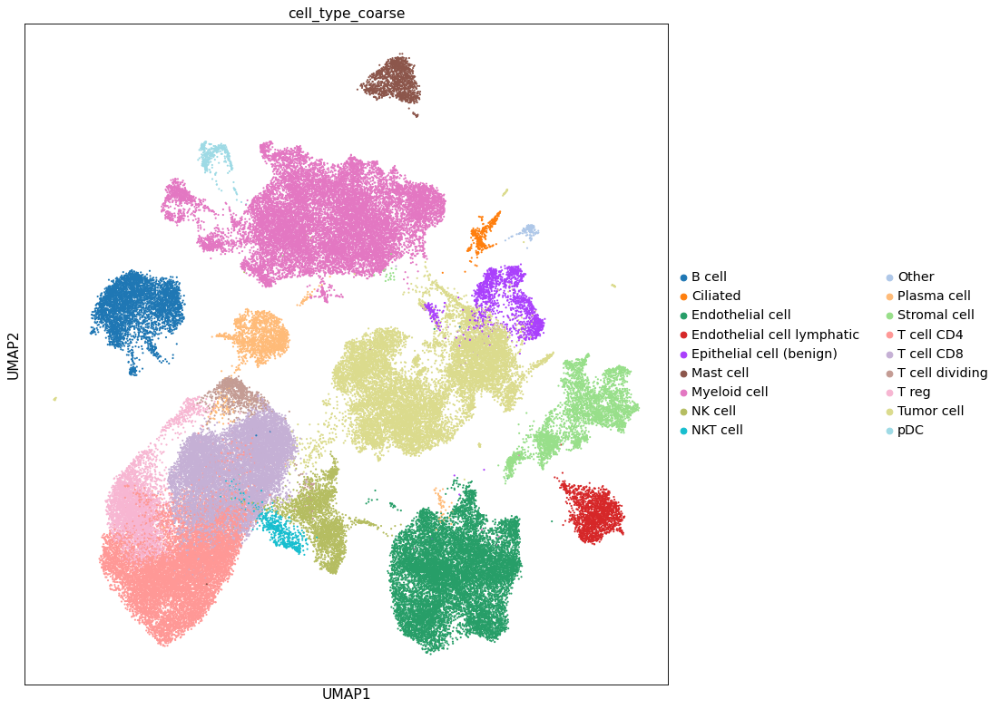

In [60]:
sc.set_figure_params(figsize=(14, 10))
ax = sc.pl.umap(adata, color=["cell_type_coarse"], size=15, show=False)
fig = ax.get_figure()
fig.tight_layout()
fig.savefig(f"{deploy_dir}/umap_cell_type_coarse.pdf")

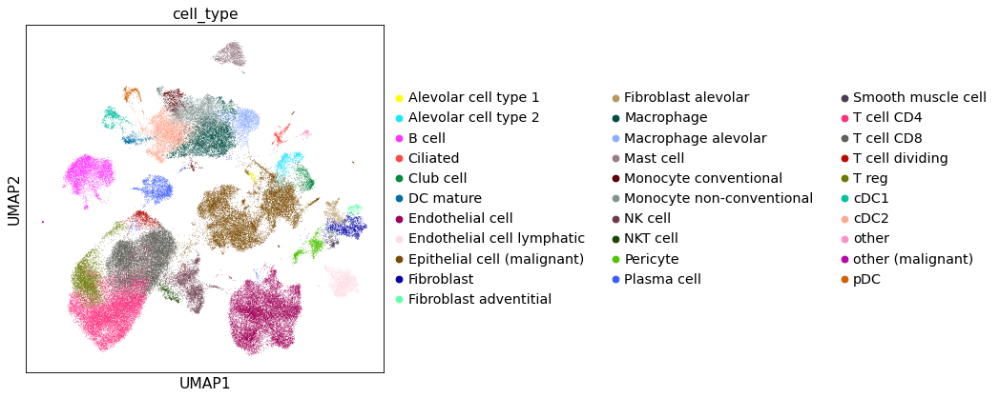

In [61]:
sc.set_figure_params(figsize=(6, 6))
sc.pl.umap(adata, color=["cell_type"])

## DE analysis using scVI

In [62]:
adata.shape

(86061, 17567)

In [63]:
import warnings

In [64]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    scvi.data.setup_anndata(adata, batch_key="sample", layer="raw_counts")
    try:
        model = scvi.model.SCVI.load(
            f"../../tables/scvi_backup/scvi_model_merged_nsclc_heterogeneity/",
            adata,
        )
    except OSError:
        model = scvi.model.SCVI(adata, use_cuda=True)
        model.train()
        model.save(f"../../tables/scvi_backup/scvi_model_merged_nsclc_heterogeneity/")

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["raw_counts"]                                          
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 86061 cells, 17567 vars, 117      
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          
INFO     Using data from adata.layers["raw_counts"]                                          
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mea

In [65]:
for col in ["cell_type", "cell_type_coarse"]:
    # try to load from cache
    try:
        scvi_res = pd.read_csv(f"{output_dir}/all_{col}_scvi_res.csv", index_col=0)
    except FileNotFoundError:
        scvi_res = de.scvi(adata, model, groupby=col)
        scvi_res.index.name = "gene_symbol"
        scvi_res.reset_index(inplace=True)
        scvi_res = scvi_res.drop(
            columns=[
                "scale1",
                "scale2",
                "proba_de",
                "lfc_median",
                "lfc_std",
                "lfc_min",
                "lfc_max",
                "is_de_fdr_0.05",
            ]
        ).rename(
            columns={
                "proba_not_de": "scvi_adjusted_pvalue",
                "bayes_factor": "scvi_log_bayes_factor",
                "lfc_mean": "scvi_lfc_mean",
                "raw_mean1": "scvi_raw_mean1",
                "raw_mean2": "scvi_raw_mean2",
                "non_zeros_proportion1": "scvi_non_zeros_proportion1",
                "non_zeros_proportion2": "scvi_non_zeros_proportion2",
                "raw_normalized_mean1": "scvi_raw_normalized_mean1",
                "raw_normalized_mean2": "scvi_raw_normalized_mean2",
            }
        )
        scvi_res.to_csv(f"{output_dir}/all_{col}_scvi_res.csv")
        scvi_res.to_csv(f"{deploy_dir}/all_{col}_scvi_res.csv")

DE...: 100%|██████████| 18/18 [10:44<00:00, 35.82s/it]


## Write output files

In [66]:
adata.write_h5ad(f"{output_dir}/primary-tumor-annotated-integrated.h5ad")

In [67]:
# adata_scvi = sc.AnnData(X=adata.obsm["X_scANVI"], obs=adata.obs.loc[:, ["cell_type", "cnv_leiden"]])
# adata_scvi.write_h5ad("../../tables/single_cell_annotations/primary_tumor_integrated/adata_scvi.h5ad", compression="gzip", compression_opts=9)

In [68]:
# adata.obs.loc[:, ["cell_type", "cnv_leiden"]].to_csv("../../tables/single_cell_annotations/primary_tumor_integrated/cell_type_annotations.csv")